# **CNN V.1**

## Requirements

In [1]:
from google.colab import files
uploaded = files.upload()

Saving requirements.txt to requirements.txt


In [2]:
%pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.0/58.0 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.9/85.9 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.1/260.1 kB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 83.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 86.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.4/113.4 kB 13.0 MB/s eta 0:00:00
  Attempting uninstall: librosa
    Found existing installation: librosa 0.11.0
    Uninstalling librosa-0.11.0:
      Successfully uninstalled librosa-0.11.0


## Libraries

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import librosa
import sklearn
import tensorflow as tf
import IPython
import tqdm
from tensorflow.keras.callbacks import CSVLogger, EarlyStopping, ModelCheckpoint, LearningRateScheduler
import pandas as pd
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
plt.style.use("seaborn-v0_8")

from audiomentations import AddGaussianSNR, PitchShift, TimeStretch, ApplyImpulseResponse
from pedalboard import Pedalboard, Compressor


## Dataset

In [5]:
!unzip MIT_Acoustical_Reverberation_Scene.zip

Archive:  MIT_Acoustical_Reverberation_Scene.zip
   creating: Audio/
  inflating: Audio/.DS_Store         
   creating: __MACOSX/
   creating: __MACOSX/Audio/
  inflating: __MACOSX/Audio/._.DS_Store  
  inflating: Audio/h001_Bedroom_65txts.wav  
  inflating: Audio/h002_Bedroom_62txts.wav  
  inflating: Audio/h003_Office_LargeBrickWalledOpenPlanOffice_56txts.wav  
  inflating: Audio/h004_LivingRoom_Large_48txts.wav  
  inflating: Audio/h005_Office_Small_44txts.wav  
  inflating: Audio/h006_Bedroom_42txts.wav  
  inflating: Audio/h007_Bathroom_Small_41txts.wav  
  inflating: Audio/h008_Bedroom_35txts.wav  
  inflating: Audio/h009_Office_32txts.wav  
  inflating: Audio/h010_Livingroom_31txts.wav  
  inflating: Audio/h011_Car_29txts.wav  
  inflating: Audio/h012_Kitchen_22txts.wav  
  inflating: Audio/h013_Hospital_ExaminationRoom_19txts.wav  
  inflating: Audio/h014_HomeExerciseRoom_18txts.wav  
  inflating: Audio/h015_Bedroom_174txts.wav  
  inflating: Audio/h016_MasterBedroom_15txts.wav

Required [ESC-50 Dataset](https://github.com/karolpiczak/ESC-50/archive/master.zip)

In [6]:
!wget https://github.com/karolpiczak/ESC-50/archive/master.zip
!unzip master.zip

--2025-06-08 10:02:37--  https://github.com/karolpiczak/ESC-50/archive/master.zip
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/karolpiczak/ESC-50/zip/refs/heads/master [following]
--2025-06-08 10:02:37--  https://codeload.github.com/karolpiczak/ESC-50/zip/refs/heads/master
Resolving codeload.github.com (codeload.github.com)... 140.82.112.10
Connecting to codeload.github.com (codeload.github.com)|140.82.112.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘master.zip’

master.zip              [                 <=>] 615.78M  14.9MB/s    in 39s     

2025-06-08 10:03:16 (15.7 MB/s) - ‘master.zip’ saved [645695005]

Archive:  master.zip
33c8ce9eb2cf0b1c2f8bcf322eb349b6be34dbb6
   creating: ESC-50-master/
   creating: ESC-50-master/.circleci/
  inflating: ESC-50-

### Loading of the dataset of the metadata and dataset analysis

In [7]:
fn_csv = 'ESC-50-master/meta/esc50.csv'

ds_files = []  # File list
ds_labels = []  # Class list

ds = pd.read_csv(fn_csv)
ds.head()

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A


In [8]:
#unique class labels
unique_classes = ds['category'].unique()
print("Unique classes:", unique_classes)

# Check the number of unique class labels
print("Count:", len(unique_classes))

# Filling the lists with filenames and labels
ds_files = ds['filename'].values
pure_ds_labels = ds['category'].values

Unique classes: ['dog' 'chirping_birds' 'vacuum_cleaner' 'thunderstorm' 'door_wood_knock'
 'can_opening' 'crow' 'clapping' 'fireworks' 'chainsaw' 'airplane'
 'mouse_click' 'pouring_water' 'train' 'sheep' 'water_drops'
 'church_bells' 'clock_alarm' 'keyboard_typing' 'wind' 'footsteps' 'frog'
 'cow' 'brushing_teeth' 'car_horn' 'crackling_fire' 'helicopter'
 'drinking_sipping' 'rain' 'insects' 'laughing' 'hen' 'engine' 'breathing'
 'crying_baby' 'hand_saw' 'coughing' 'glass_breaking' 'snoring'
 'toilet_flush' 'pig' 'washing_machine' 'clock_tick' 'sneezing' 'rooster'
 'sea_waves' 'siren' 'cat' 'door_wood_creaks' 'crickets']
Count: 50


Check whether Ydata is balanced or not by plotting the histogram.

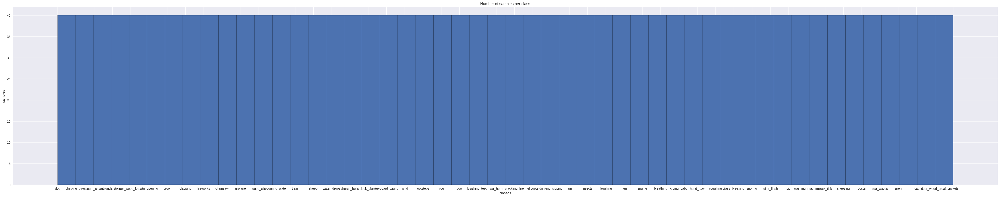

In [9]:
plt.figure(figsize=(55, 10))
plt.title("Number of samples per class")
plt.hist(np.asarray(pure_ds_labels), bins=50, edgecolor='black')
plt.xlabel("classes")
plt.ylabel("samples")
plt.show()

Transient sound:


Continous sound:


Intermittent sound:


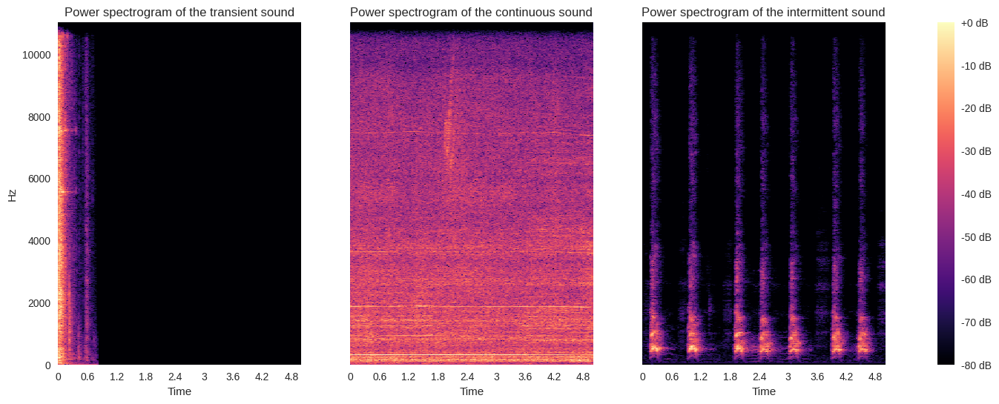

In [10]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-84705-A-39.wav'  # Transient
file1 = path + '1-19872-A-36.wav'  # Continuous
file2 = path + '1-30344-A-0.wav'   # Intermittent

name = ['transient', 'continuous', 'intermittent']

# Show audio player for each file
print('Transient sound:')
IPython.display.display(IPython.display.Audio(data=file0))
print('Continous sound:')
IPython.display.display(IPython.display.Audio(data=file1))
print('Intermittent sound:')
IPython.display.display(IPython.display.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Fra quelli simili si fa confusione: se vuelve loco

Washing machine sound:


Helicopter sound:


Engine sound:


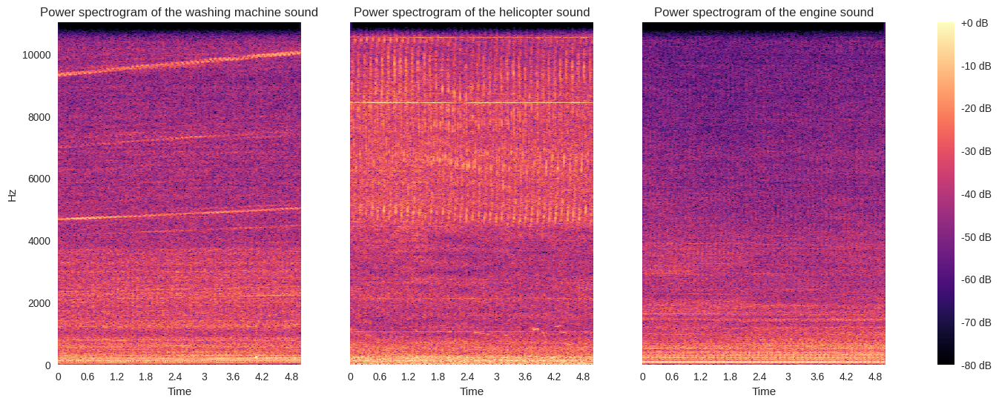

In [11]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-23996-B-35.wav'
file1 = path + '1-172649-A-40.wav'
file2 = path + '5-232272-A-44.wav'


name = ['washing machine', 'helicopter', 'engine']

# Show audio player for each file
print('Washing machine sound:')
IPython.display.display(IPython.display.Audio(data=file0))
print('Helicopter sound:')
IPython.display.display(IPython.display.Audio(data=file1))
print('Engine sound:')
IPython.display.display(IPython.display.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Se vogliamo mettere come c'è un'alta variabilità nella stessa classe. Vogliamo l'abbaio

First dog sound:


Second dog sound:


Third dog sound:


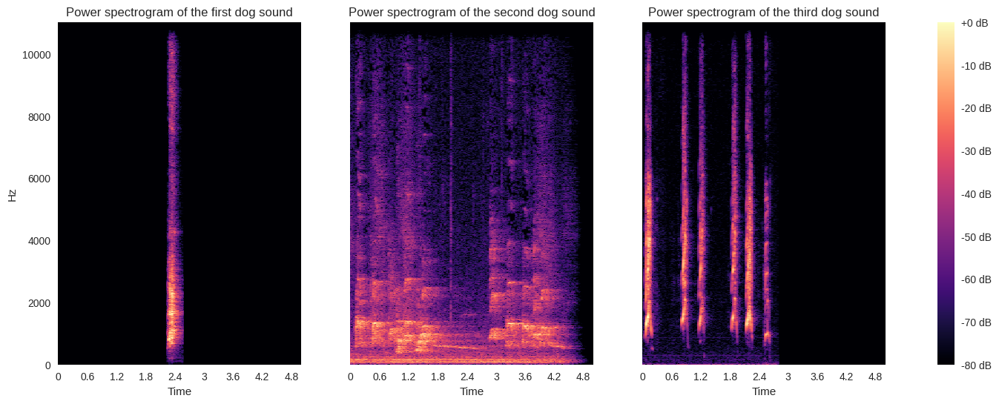

In [12]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-100032-A-0.wav'
file1 = path + '3-136288-A-0.wav'
file2 = path + '5-9032-A-0.wav'

name = ['first dog', 'second dog', 'third dog']

# Show audio player for each file
print('First dog sound:')
IPython.display.display(IPython.display.Audio(data=file0))
print('Second dog sound:')
IPython.display.display(IPython.display.Audio(data=file1))
print('Third dog sound:')
IPython.display.display(IPython.display.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Un'altra cosa da far notare è che non esiste una vera conoscenza e struttura di suoni ambientali ('o ritmo, o suono, 'o mare). Harmonic percussion

Harmonic component


Percussive component


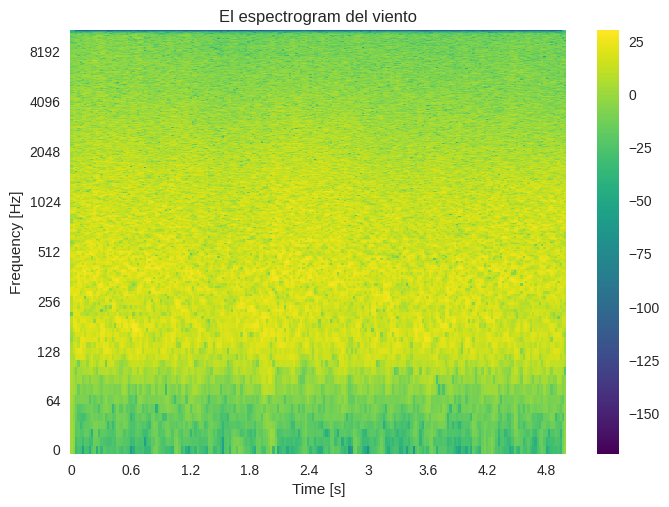

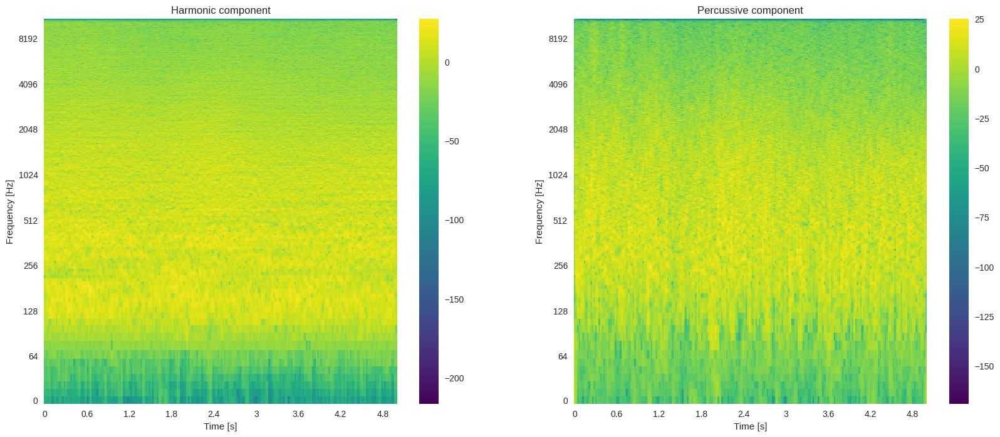

In [13]:
path = 'ESC-50-master/audio/'
file0 = path + '1-51037-A-16.wav'

sound, sr = librosa.load(file0)

S = librosa.stft(sound)

librosa.display.specshow(20*np.log10(np.abs(S)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'El espectrogram del viento')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

Hmm, Prs = librosa.decompose.hpss(S)

plt.figure(figsize=(20,8))

plt.subplot(1, 2, 1)
librosa.display.specshow(20*np.log10(np.abs(Hmm)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Harmonic component')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

plt.subplot(1, 2, 2)
librosa.display.specshow(20*np.log10(np.abs(Prs)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Percussive component')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

print(f'Harmonic component')
IPython.display.display(IPython.display.Audio(librosa.istft(Hmm), rate=sr))
print(f'Percussive component')
IPython.display.display(IPython.display.Audio(librosa.istft(Prs), rate=sr))

## Pre-processing

Required [MIT Acoustical Reverberation Scene Statistics Survey](https://mcdermottlab.mit.edu/Reverb/IRMAudio/Audio.zip)

We decided to use audiomentations instead of the PyTorch one in order to have compressors.
-	Add different background noises with different SNRs
-	Pitch shifting
-	Time stretching
-	Dynamic range compression
-	Convolution with impulse responses

Background noise

In [14]:
def addGaussianNoise(signal, sr, min_snr_db, max_snr_db, activation_prob):
    """
    Adds Gaussian noise to the audio signal with a specified SNR range and activation probability.
    Args:
        signal (np.ndarray): The audio signal to augment.
        sr (int): Sample rate of the audio signal.
        min_snr_db (float): Minimum SNR in dB.
        max_snr_db (float): Maximum SNR in dB.
        activation_prob (float): Probability of applying the augmentation.
    Returns:
        np.ndarray: The augmented audio signal with Gaussian noise added.
    """

    transform = AddGaussianSNR(
        min_snr_db=min_snr_db,
        max_snr_db=max_snr_db,
        p=activation_prob
    )
    augmented_signal = transform(samples=signal, sample_rate=sr)
    return augmented_signal

Pitch Shifting

In [15]:
def pitchShifter(signal, sr, min_semitones, max_semitones, activation_prob):
    """
    Shifts the pitch of the audio signal by a random number of semitones within a specified range.
    Args:
        signal (np.ndarray): The audio signal to augment.
        sr (int): Sample rate of the audio signal.
        min_semitones (int): Minimum number of semitones to shift.
        max_semitones (int): Maximum number of semitones to shift.
        activation_prob (float): Probability of applying the augmentation.
    Returns:
        np.ndarray: The augmented audio signal with pitch shifted.
    """

    transform = PitchShift(
        min_semitones=min_semitones,
        max_semitones=max_semitones,
        p=activation_prob
    )
    augmented_signal = transform(samples=signal, sample_rate=sr)
    return augmented_signal

Time Stretching

In [16]:
def timeStretcher(signal, sr, min_rate, max_rate, activation_prob, leave_length_unchanged=True):
    """
    Stretches or compresses the audio signal in time by a random factor within a specified range.
    Args:
        signal (np.ndarray): The audio signal to augment.
        sr (int): Sample rate of the audio signal.
        min_rate (float): Minimum stretch/compression rate.
        max_rate (float): Maximum stretch/compression rate.
        activation_prob (float): Probability of applying the augmentation.
        leave_length_unchanged (bool): If True, the length of the output signal will be the same as the input.
    Returns:
        np.ndarray: The augmented audio signal with time-stretching applied.
    """

    transform = TimeStretch(
        min_rate=min_rate,
        max_rate=max_rate,
        leave_length_unchanged=leave_length_unchanged,
        p=activation_prob
    )

    augmented_sound = transform(signal, sample_rate=sr)
    return augmented_sound

Compressor

In [17]:
def compressor(signal, sr, threshold_db, ratio, attack_ms, release_ms):
    """
    Applies a compressor to the audio signal.
    Args:
        signal (np.ndarray): The audio signal to compress.
        sr (int): Sample rate of the audio signal.
        threshold_db (float): Threshold in dB for the compressor.
        ratio (float): Compression ratio.
        attack_ms (int): Attack time in milliseconds.
        release_ms (int): Release time in milliseconds.
    Returns:
        np.ndarray: The compressed audio signal.
    """

    original_dtype = signal.dtype

    if signal.ndim == 1:
        signal = np.expand_dims(signal, axis=1)  # from [samples] to [samples, 1]

    signal = signal.T  # from [samples, channels] to [channels, samples]

    board = Pedalboard([
        Compressor(threshold_db=threshold_db, ratio=ratio, attack_ms=attack_ms, release_ms=release_ms),
    ])

    processed = board(signal, sr)  # output shape: [channels, samples]

    # Back to [samples, channels]
    augmented_sound = processed.T

    # Convert to the original dtype
    if augmented_sound.dtype != original_dtype:
        if np.issubdtype(original_dtype, np.integer):
            max_val = np.max(np.abs(augmented_sound))
            if max_val > 0:
                normalized = augmented_sound / max_val
            else:
                normalized = augmented_sound
            info = np.iinfo(original_dtype)
            scaled = (normalized * info.max).clip(info.min, info.max).astype(original_dtype)
            augmented_sound = scaled
        else:
            augmented_sound = augmented_sound.astype(original_dtype)

    augmented_sound = np.squeeze(augmented_sound)  # Remove any singleton dimensions

    return augmented_sound

Impulse respones convolution

In [26]:
def convolver(signal, sr, activation_prob):
    """
    Applies an impulse response to the audio signal to simulate reverberation.
    Args:
        signal (np.ndarray): The audio signal to convolve.
        sr (int): Sample rate of the audio signal.
        activation_prob (float): Probability of applying the convolution.
    Returns:
        np.ndarray: The augmented audio signal with convolution applied.
    """

    transform = ApplyImpulseResponse(ir_path="Audio", p=activation_prob)

    augmented_sound = transform(signal, sample_rate=sr)

    return augmented_sound

Pre-processing for a single track

In [19]:
def preProcessingSignal(
    signal, sr,
    label,
    gaussianParameters=None,
    pitchParameters=None,
    timeStretchParameters=None,
    compressorParameters=None,
    convolverParameters=None
    ):
    """
    Preprocesses the audio signal by applying various augmentations based on the provided parameters.
    Args:
        signal (np.ndarray): The audio signal to preprocess.
        sr (int): Sample rate of the audio signal.
        label (str): Label for the audio signal.
        gaussianParameters (tuple, optional): Parameters for Gaussian noise augmentation (min_snr_db, max_snr_db, activation_prob).
        pitchParameters (tuple, optional): Parameters for pitch shifting (min_semitones, max_semitones, activation_prob).
        timeStretchParameters (tuple, optional): Parameters for time stretching (min_rate, max_rate, activation_prob, leave_length_unchanged).
        compressorParameters (tuple, optional): Parameters for compression (threshold_db, ratio, attack_ms, release_ms).
        convolverParameters (float, optional): Probability of applying convolution with impulse response.
    Returns:
        tuple: A tuple containing a list of processed signals and their corresponding labels.
    """

    signals = []
    labels = []

    signals.append(signal)
    labels.append(label)

    if gaussianParameters is not None:
        min_snr_db, max_snr_db, activation_prob = gaussianParameters
        signal_1 = addGaussianNoise(signal, sr, min_snr_db, max_snr_db, activation_prob)
        print(f"Added Gaussian noise with SNR range: {min_snr_db} to {max_snr_db} dB, activation probability: {activation_prob}")
        signals.append(signal_1)
        labels.append(label)

    if pitchParameters is not None:
        min_semitones, max_semitones, activation_prob = pitchParameters
        signal_2 = pitchShifter(signal, sr, min_semitones, max_semitones, activation_prob)
        print(f"Pitch shifted by {min_semitones} to {max_semitones} semitones, activation probability: {activation_prob}")
        signals.append(signal_2)
        labels.append(label)

    if timeStretchParameters is not None:
        min_rate, max_rate, activation_prob, leave_length_unchanged = timeStretchParameters
        signal_3 = timeStretcher(signal, sr, min_rate, max_rate, activation_prob, leave_length_unchanged)
        print(f"Time stretched/compressed by a factor of {min_rate} to {max_rate}, activation probability: {activation_prob}, leave length unchanged: {leave_length_unchanged}")
        signals.append(signal_3)
        labels.append(label)

    if compressorParameters is not None:
        threshold_db, ratio, attack_ms, release_ms = compressorParameters
        signal_4 = compressor(signal, sr, threshold_db, ratio, attack_ms, release_ms)
        print(f"Applied compressor with threshold: {threshold_db} dB, ratio: {ratio}, attack: {attack_ms} ms, release: {release_ms} ms")
        signals.append(signal_4)
        labels.append(label)

    if convolverParameters is not None:
        activation_prob = convolverParameters
        signal_5 = convolver(signal, sr, activation_prob)
        print(f"Applied convolution with impulse response, activation probability: {activation_prob}")
        signals.append(signal_5)
        labels.append(label)

    return signals, labels



Pre-processing for the entire dataset

In [20]:
def preProcessingDataset(
    Xdata, sr,
    Ydata,
    gaussianParameters=None,
    pitchParameters=None,
    timeStretchParameters=None,
    compressorParameters=None,
    convolverParameters=None
):
    """
    Preprocesses a dataset of audio signals by applying various augmentations based on the provided parameters.
    Args:
        Xdata (list): List of audio signals to preprocess.
        sr (int): Sample rate of the audio signals.
        Ydata (list): List of labels corresponding to the audio signals.
        gaussianParameters (tuple, optional): Parameters for Gaussian noise augmentation (min_snr_db, max_snr_db, activation_prob).
        pitchParameters (tuple, optional): Parameters for pitch shifting (min_semitones, max_semitones, activation_prob).
        timeStretchParameters (tuple, optional): Parameters for time stretching (min_rate, max_rate, activation_prob, leave_length_unchanged).
        compressorParameters (tuple, optional): Parameters for compression (threshold_db, ratio, attack_ms, release_ms).
        convolverParameters (float, optional): Probability of applying convolution with impulse response.
    Returns:
        tuple: A tuple containing a numpy array of processed signals and a numpy array of their corresponding labels.
    """

    all_signals = []
    all_labels = []

    for signal, label in zip(Xdata, Ydata):
        signals, labels = preProcessingSignal(
            signal, sr, label,
            gaussianParameters,
            pitchParameters,
            timeStretchParameters,
            compressorParameters,
            convolverParameters
        )
        all_signals.extend(signals)
        all_labels.extend(labels)

    all_signals = np.asarray(all_signals)
    all_labels = np.asarray(all_labels)

    return all_signals, all_labels

## Load signals

Nos cargamos todos los signales

In [21]:
pure_signals = []
audio_folder = "ESC-50-master/audio/"

for file in ds_files:
    filepath = os.path.join(audio_folder, file)
    pure_signal, sr = librosa.load(filepath, sr=44100)
    pure_signals.append(pure_signal)

Check pre pre-processing

In [22]:
print(f"Number of audio files: {len(pure_signals)}")
print(f"Number of audio labels: {len(pure_ds_labels)}")

Number of audio files: 2000
Number of audio labels: 2000


Lista -> np

In [23]:
pure_signals_array = np.asarray(pure_signals)

# Transform the labels to numbers
label_mapping = {label: idx for idx, label in enumerate(dict.fromkeys(pure_ds_labels))}
numerical_labels = np.array([label_mapping[label] for label in pure_ds_labels])

Ydata = np.asarray(numerical_labels)

print('Pure signals length: {} \nYata shape: {}'.format(pure_signals_array.shape, Ydata.shape))

Pure signals length: (2000, 220500) 
Yata shape: (2000,)


## **Data Augmentation**

Dataset splitting with cross-validation, inspired by [Heittola, 2017](https://inria.hal.science/hal-01627981/)

Stratified K-Fold Cross Validation: ensures that each fold maintains the same class distribution as the original dataset

In [24]:
seed = 1234

train_size = 0.7
val_size = 0.2
test_size = 0.1

seed = 1234
X_train, X_temp, y_train, y_temp = train_test_split(pure_signals_array, Ydata, train_size=train_size, random_state=seed, shuffle=True , stratify=Ydata)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=np.round(test_size/(test_size + val_size),2), random_state=seed, shuffle=True , stratify=y_temp)


# Shapes for each partition
print('X_train shape: {} \nX_val shape: {} \nX_test shape: {} \ny_train shape: {} \ny_val shape: {} \ny_test shape: {} \n'.format(X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape))


X_train shape: (1400, 220500) 
X_val shape: (402, 220500) 
X_test shape: (198, 220500) 
y_train shape: (1400,) 
y_val shape: (402,) 
y_test shape: (198,) 



In [27]:
X_train_aug, Y_train_aug = preProcessingDataset(
    Xdata=X_train,
    sr=sr,
    Ydata=y_train,
    gaussianParameters = (5, 40, 1),
    pitchParameters = (-5, 5, 1),
    timeStretchParameters = (0.8, 1.25, 1, True),
    compressorParameters = (-20, 4.0, 10.0, 100.0),
    convolverParameters = 1
)

Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h127_Supermarket_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h117_MITCampus_Atrium_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h149_Outside_StreetsOfSomerville_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h205_Outside_Forest_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h075_Hallway_Office_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h099_Classroom_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h203_Outside_StreetsOfSomerville_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h043_Train_BostonTRedLine_4txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h113_IceCreamParlor_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h095_Campground_Cabin_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h086_Bar_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h046_SuburbanGarage_4txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h107_Supermerket_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h101_Classroom_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h236_BostonPubliLibrary_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h138_Outside_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h201_MITCampus_DramaRoom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h225_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h081_Shower_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h174_Bar_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h154_OfficeKitchen_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h200_DryCleaners_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h263_Outside_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h045_Livingroom_4txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h114_Restaurant_txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h134_ParkingLot_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h180_Outside_Field_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h084_Outside_SuburbanBackyard_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h210_Outside_Forest_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h023_Bedroom_9txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h085_Bar_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h097_MITCampus_Atrium_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h019_MITCampus_Atrium_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h167_Outside_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h067_Bar_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h153_Office_Foyer_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h241_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h035_Bar_LargeSportsBar_5txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h148_Outside_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h235_Outside_Field_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h015_Bedroom_174txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h256_Stairwell_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h057_Outside_SuburbanDriveway_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h143_Outside_StreetsOfBoston_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h269_Office_ConferenceRoom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h020_Livingroom_10txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h009_Office_32txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h058_Campground_Dininghall_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h060_Office_ConferenceRoom_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h223_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h066_MITCampus_StudentLounge_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h126_Outside_Skatepark.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h226_Pizzeria_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h119_BasementStorage_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h012_Kitchen_22txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h183_BackPorchOfSuburbanHome_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h139_OutsideStreetsOfBoston_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h054_Kitchen_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h246_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h157_ArtGallery_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h175_ParkingLot_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h028_Classroom_8txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h116_SuperMarket_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h027_Classroom_8txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h168_Outside_StreetsOfcambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h042_Hallway_ElementarySchool_4txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h258_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h133_SubwayStation_ParkStreetBoston_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h110_Office_MeetingRoom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h199_Outside_DoorstepOfHouseInCambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h080_Outdoor_GrassyField_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h146_Outside_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h112_Bookstore_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h152_OfficeBathroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h130_Restaurant_1txs.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h251_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h193_LivingRoom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h196_FastFoodRestaurant_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h243_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h162_Outside_Playground_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h050_Bar_IrishPub_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h160_DepartmentStore_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h005_Office_Small_44txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h007_Bathroom_Small_41txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h122_CoffeeShop_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h187_Outside_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h204_Outside_Forest_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h271_Outside_InTramStopRainShelter_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h253_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h260_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h053_Office_ConferenceRoom_stxts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h267_MITCampus_Atrium_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h250_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h065_Classroom_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h034_Classroom_6txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h010_Livingroom_31txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h088_Outside_SuburbanDriveway_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h194_Outside_SuburbanDriveway_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h074_Outside_StreetsOfCambridge_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h182_Hallway_MITInfiniteCorridor_1txt.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h189_Outside_GravelPathThroughForest_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h213_SubwayStation_CentralSquareCambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h264_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h248_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h164_Restaurant_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h111_Kitchen_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h184_BilliardsRoom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h137_Outside_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h270_Hallway_House_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h002_Bedroom_62txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h212_Outside_StreetsOfSomerville_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h144_Outside_StreetsOfSomerville_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h016_MasterBedroom_15txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h103_Classroom_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h003_Office_LargeBrickWalledOpenPlanOffice_56txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h185_Hallway_House_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h102_Stairwell_ElementraySchool_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h211_Stairwell_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h125_Bar_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h219_StreetsOfCambridge_1txs.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h207_Outside_Forest_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h071_Shower_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h228_Outside_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h197_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h230_SuburbanBackyard_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h169_IceCreamParlor_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h217_Outside_StreetsOfcambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h163_Bathroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h252_Auditorium_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h124_Outside_MITCampusCourtyard_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h013_Hospital_ExaminationRoom_19txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h238_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h231_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h140_Outside_StreetsOfSomerville_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h062_Campground_Dininghall_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h129_Supermarket_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h172_Outside_EntranceOfLexingtonPublicLibrary_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h234_Bathroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h151_Train_BostonTOrangeLine_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h206_Outside_Forest_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h022_Office_Foyer_9txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h032_Bedroom_6txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h072_Bar_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h176_LivingRoom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h262_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h089_MITCampus_StudentLounge_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h131_Outside_PathAroundResevoir_1txs.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h017_Livingroom_152txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h216_Outside_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h106_Classroom_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h202_Diningroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h108_MITCampus_ComputerRoom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h091_Bar_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h142_Outside_StreetsOfBoston_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h179_Bar_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h055_Hallway_House_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h083_Outside_ParkingLot_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h218_StreetsOfBoston_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h171_Outside_BikePath_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h052_Gym_WeightRoom_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h209_Outside_Forest_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h261_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h239_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h036_Bathroom_5txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h222_StreetsOfcambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h214_Pizzeria_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h073_MITCampus_StudentLounge_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h098_Bedroom_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h221_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h021_Bedroom_102txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h177_MITCampus_LaundryRoom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h150_Outside_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h141_Outside_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h068_SwimmingPool_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h254_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h096_Hotel_Ballroom_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h181_Hallway_MITInfiniteCorridor_1txs.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h135_KitchePantry_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h078_Bar_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h063_Cafeteria_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h069_Supermarket_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h082_HomeFoyer_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h059_Outside_StreetsOfCambridge_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h041_TrainStation_SouthStationBoston_4txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h224_StreetsOfBoston_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h161_MITCampus_Atrium_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h105_Classroom_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h092_Office_ConferenceRoom_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h006_Bedroom_42txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h195_Outside_SuburbanFronyYard_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h245_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h011_Car_29txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h159_DocrorsOffice_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h136_SamdwichShop_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h033_Classroom_6txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h047_Hallway_MIT_4txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h123_WineBar_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h044_ParkingLot_4txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h061_Car_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h064_Classroom_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h178_OfficeFoyer_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h247_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h227_Outside_ParkingLot_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h026_Gym_8txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h025_Diningroom_8txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h249_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h070_Outdoor_MITBrickAmpitheater_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h147_Outside_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h173_Offixe_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h087_ArtGallery_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h090_Outside_StreetsOfCambridge_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h038_2ndFloorBalconyOfWoodenHouse_5txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h040_Clasroom_5txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h155_FastFoodRestaurant_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h056_Outside_HarvardBridgeBetweenCambridgeAndBoston_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h128_Supermarket_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h208_Outside_Forest_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h132_ToyStore_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h120_Gym_WeightRoom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h255_MITCampus_StudentLounge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h014_HomeExerciseRoom_18txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h115_MovieTheater_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h004_LivingRoom_Large_48txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h156_Outside_StreetsOfCambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h191_Kitchen_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h190_Train_BostonTGreenline_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h186_Outside_SoccerField_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h268_BasementOfSuburbanHome_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h145_Outside_StreetsOfBoston_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h109_CoffeeShop_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h242_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h077_MITCampus_StudentLounge_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h265_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h076_OfficeBathroom_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms


/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h008_Bedroom_35txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h188_Bar_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h198_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h030_Campground_AFrameCabin_8txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h257_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h029_BabysRoom_8txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h244_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h104_Classroom_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h094_Campground_CabinLivingroom_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h266_MITCampus_StduentLounge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h229_Office_Lobby_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h018_Kitchen_12txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h031_Bedroom_7txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h158_HospitalWaitingRoom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h100_Classroom_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h170_Outside_BikePath_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h220_StreetsOfcambridge_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h118_MITCampus_Atrium_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h232_Hallway_MITCampus_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h048_Bathroom_MITCampus_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h121_MITCampus_Atrium_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h237_Classroom_1txs.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h240_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h039_Classroom_5txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h079_Bar_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h024_Bathroom_9txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h037_Classroom_5txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h215_SandwichShop_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h093_Restaurant_2txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.2

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h259_Classroom_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h049_MallFoodCourt_BurlingtonMall_3txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h192_PorchOfSuburbanHouse_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, releas

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h165_Bar_1txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compress

/usr/local/lib/python3.11/dist-packages/audiomentations/core/audio_loading_utils.py:37: UserWarning: /content/Audio/h001_Bedroom_65txts.wav had to be resampled from 32000 Hz to 44100 Hz. This hurt execution time.
  warnings.warn(


Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activation probability: 1
Time stretched/compressed by a factor of 0.8 to 1.25, activation probability: 1, leave length unchanged: True
Applied compressor with threshold: -20 dB, ratio: 4.0, attack: 10.0 ms, release: 100.0 ms
Applied convolution with impulse response, activation probability: 1
Added Gaussian noise with SNR range: 5 to 40 dB, activation probability: 1
Pitch shifted by -5 to 5 semitones, activati

In [28]:
print('X_train_aug shape: {} \ny_train_aug shape: {} \nX_val shape: {} \ny_val shape: {} \nX_test shape: {} \ny_test shape: {}\n'.format(X_train_aug.shape, Y_train_aug.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape))

type_of_processing = [
    "Original",
    "Gaussian Noise",
    "Pitch Shift",
    "Time Stretch",
    "Compressor",
    "Convolver"
]

# Listen to the first 5 augmented audio files
for i in range(6):
    print(type_of_processing[i])
    IPython.display.display(IPython.display.Audio(data=X_train_aug[i], rate=sr))

X_train_aug shape: (8400, 220500) 
y_train_aug shape: (8400,) 
X_val shape: (402, 220500) 
y_val shape: (402,) 
X_test shape: (198, 220500) 
y_test shape: (198,)

Original


Gaussian Noise


Pitch Shift


Time Stretch


Compressor


Convolver


## **Feature Extraction**

In [29]:
def calculate_stft(x,n_fft=512, hop_length=256, win_length=512):
    X = librosa.stft(x, n_fft=n_fft, win_length= win_length, hop_length=hop_length)
    X_pow_db = librosa.power_to_db(np.abs(X)**2)
    return X_pow_db

In [30]:
stft_train = []

for signal in X_train_aug:
    stft = calculate_stft(signal)
    stft_train.append(stft)

In [31]:
stft_val = []

for signal in X_val:
    stft = calculate_stft(signal)
    stft_val.append(stft)

In [32]:
stft_test = []

for signal in X_test:
    stft = calculate_stft(signal)
    stft_test.append(stft)

In [33]:
X_train_aug = np.array(stft_train)
X_val = np.array(stft_val)
X_test = np.array(stft_test)

print('X_train_aug shape: {} \nY_train_aug shape: {} \nX_val shape: {} \ny_val shape: {} \nX_test shape: {} \ny_test shape: {}'.format(X_train_aug.shape, Y_train_aug.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape))

X_train_aug shape: (8400, 257, 862) 
Y_train_aug shape: (8400,) 
X_val shape: (402, 257, 862) 
y_val shape: (402,) 
X_test shape: (198, 257, 862) 
y_test shape: (198,)


In [34]:
# We expand the data to make them fit the 2D model
X_train_exp = np.expand_dims(X_train_aug, axis=-1)
X_val_exp = np.expand_dims(X_val, axis=-1)
X_test_exp = np.expand_dims(X_test, axis=-1)

print('X_train_exp shape: {} \nX_val_exp shape: {} \nX_test_exp shape: {}'.format(X_train_exp.shape, X_val_exp.shape, X_test_exp.shape))

X_train_exp shape: (8400, 257, 862, 1) 
X_val_exp shape: (402, 257, 862, 1) 
X_test_exp shape: (198, 257, 862, 1)


## **Model Definition**

In [35]:
def cba(inputs, filters, kernel_size, strides):
    x = tf.keras.layers.Conv2D(filters, kernel_size=kernel_size, strides=strides, padding='same')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation("relu")(x)
    return x

In [36]:
inputs = tf.keras.layers.Input(shape=(X_train_exp.shape[1:]))

x_1 = cba(inputs, filters=32, kernel_size=(1,8), strides=(1,2))
x_1 = cba(x_1, filters=32, kernel_size=(8,1), strides=(2,1))
x_1 = cba(x_1, filters=64, kernel_size=(1,8), strides=(1,2))
x_1 = cba(x_1, filters=64, kernel_size=(8,1), strides=(2,1))

x_2 = cba(inputs, filters=32, kernel_size=(1,16), strides=(1,2))
x_2 = cba(x_2, filters=32, kernel_size=(16,1), strides=(2,1))
x_2 = cba(x_2, filters=64, kernel_size=(1,16), strides=(1,2))
x_2 = cba(x_2, filters=64, kernel_size=(16,1), strides=(2,1))

x_3 = cba(inputs, filters=32, kernel_size=(1,32), strides=(1,2))
x_3 = cba(x_3, filters=32, kernel_size=(32,1), strides=(2,1))
x_3 = cba(x_3, filters=64, kernel_size=(1,32), strides=(1,2))
x_3 = cba(x_3, filters=64, kernel_size=(32,1), strides=(2,1))

x_4 = cba(inputs, filters=32, kernel_size=(1,64), strides=(1,2))
x_4 = cba(x_4, filters=32, kernel_size=(64,1), strides=(2,1))
x_4 = cba(x_4, filters=64, kernel_size=(1,64), strides=(1,2))
x_4 = cba(x_4, filters=64, kernel_size=(64,1), strides=(2,1))

x = tf.keras.layers.Add()([x_1, x_2, x_3, x_4])

x = cba(x, filters=128, kernel_size=(1,16), strides=(1,2))
x = cba(x, filters=128, kernel_size=(16,1), strides=(2,1))

x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(50)(x)
x = tf.keras.layers.Activation("softmax")(x)

model = tf.keras.models.Model(inputs, x)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 257, 862,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 257, 431,  │        288 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 257, 431,  │        544 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 257, 431,  │      1,056 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 257, 431,  │      2,080 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 257, 431,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 257, 431,  │        128 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 257, 431,  │        128 │ conv2d_8[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 257, 431,  │        128 │ conv2d_12[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 257, 431,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 257, 431,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_8        │ (None, 257, 431,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_12       │ (None, 257, 431,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 129, 431,  │      8,224 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 129, 431,  │     16,416 │ activation_4[0][… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 129, 431,  │     32,800 │ activation_8[0][… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_13 (Conv2D)  │ (None, 129, 431,  │     65,568 │ activation_12[0]

 Total params: 1,268,786 (4.84 MB)

 Trainable params: 1,266,738 (4.83 MB)

 Non-trainable params: 2,048 (8.00 KB)

In [37]:
# initiate Adam optimizer
opt = tf.keras.optimizers.Adam(learning_rate=0.00005, decay=1e-6, amsgrad=True)

# Let's train the model using Adam with amsgrad
model.compile(loss='sparse_categorical_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

/usr/local/lib/python3.11/dist-packages/keras/src/optimizers/base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [39]:
# CSVLogger
csv_logger = CSVLogger('model_stft.log', append=False)

# EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10)

# Model checkpoint
model_name = 'model_stft.h5'
model_checkpoint = ModelCheckpoint(model_name, monitor='val_accuracy', save_best_only=True, verbose=1)

# Store all these callbacks in a list, Callback list
callbacks = [csv_logger, early_stopping, model_checkpoint]


In [40]:
batch_size = 64

history_CNN = model.fit(X_train_exp, Y_train_aug, batch_size=batch_size, epochs=300, validation_data=(X_val_exp, y_val), callbacks=callbacks)

Epoch 1/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 518ms/step - accuracy: 0.0471 - loss: 3.7874
Epoch 1: val_accuracy improved from -inf to 0.09204, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 180s 587ms/step - accuracy: 0.0474 - loss: 3.7862 - val_accuracy: 0.0920 - val_loss: 3.5993
Epoch 2/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.1350 - loss: 3.3328
Epoch 2: val_accuracy improved from 0.09204 to 0.15174, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.1353 - loss: 3.3323 - val_accuracy: 0.1517 - val_loss: 3.1832
Epoch 3/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.2247 - loss: 3.0654
Epoch 3: val_accuracy improved from 0.15174 to 0.21393, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.2248 - loss: 3.0651 - val_accuracy: 0.2139 - val_loss: 2.8631
Epoch 4/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - accuracy: 0.3067 - loss: 2.8546
Epoch 4: val_accuracy improved from 0.21393 to 0.31841, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 301ms/step - accuracy: 0.3069 - loss: 2.8542 - val_accuracy: 0.3184 - val_loss: 2.6483
Epoch 5/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.3884 - loss: 2.6515
Epoch 5: val_accuracy improved from 0.31841 to 0.35323, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.3884 - loss: 2.6512 - val_accuracy: 0.3532 - val_loss: 2.5628
Epoch 6/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.4370 - loss: 2.4934
Epoch 6: val_accuracy improved from 0.35323 to 0.42040, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.4371 - loss: 2.4931 - val_accuracy: 0.4204 - val_loss: 2.4522
Epoch 7/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.4835 - loss: 2.3484
Epoch 7: val_accuracy improved from 0.42040 to 0.42786, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.4836 - loss: 2.3482 - val_accuracy: 0.4279 - val_loss: 2.3168
Epoch 8/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.5136 - loss: 2.2281
Epoch 8: val_accuracy improved from 0.42786 to 0.43781, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.5137 - loss: 2.2278 - val_accuracy: 0.4378 - val_loss: 2.1767
Epoch 9/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.5404 - loss: 2.1096
Epoch 9: val_accuracy improved from 0.43781 to 0.49502, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.5405 - loss: 2.1094 - val_accuracy: 0.4950 - val_loss: 2.0982
Epoch 10/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.5721 - loss: 1.9831
Epoch 10: val_accuracy improved from 0.49502 to 0.51244, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.5722 - loss: 1.9830 - val_accuracy: 0.5124 - val_loss: 2.0338
Epoch 11/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.6026 - loss: 1.8883
Epoch 11: val_accuracy improved from 0.51244 to 0.54229, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.6025 - loss: 1.8882 - val_accuracy: 0.5423 - val_loss: 2.0060
Epoch 12/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.6267 - loss: 1.7992
Epoch 12: val_accuracy improved from 0.54229 to 0.57463, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.6267 - loss: 1.7991 - val_accuracy: 0.5746 - val_loss: 1.8204
Epoch 13/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.6512 - loss: 1.7245
Epoch 13: val_accuracy did not improve from 0.57463
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.6512 - loss: 1.7244 - val_accuracy: 0.5647 - val_loss: 1.8235
Epoch 14/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.6736 - loss: 1.6311
Epoch 14: val_accuracy improved from 0.57463 to 0.58458, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.6736 - loss: 1.6310 - val_accuracy: 0.5846 - val_loss: 1.7592
Epoch 15/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.6792 - loss: 1.5713
Epoch 15: val_accuracy improved from 0.58458 to 0.61194, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.6793 - loss: 1.5712 - val_accuracy: 0.6119 - val_loss: 1.6558
Epoch 16/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.6965 - loss: 1.5228
Epoch 16: val_accuracy improved from 0.61194 to 0.64925, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.6966 - loss: 1.5226 - val_accuracy: 0.6493 - val_loss: 1.6056
Epoch 17/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.7190 - loss: 1.4490
Epoch 17: val_accuracy did not improve from 0.64925
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.7190 - loss: 1.4489 - val_accuracy: 0.6443 - val_loss: 1.5502
Epoch 18/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.7365 - loss: 1.3817
Epoch 18: val_accuracy improved from 0.64925 to 0.66169, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.7365 - loss: 1.3817 - val_accuracy: 0.6617 - val_loss: 1.4419
Epoch 19/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.7365 - loss: 1.3412
Epoch 19: val_accuracy did not improve from 0.66169
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 298ms/step - accuracy: 0.7365 - loss: 1.3411 - val_accuracy: 0.6318 - val_loss: 1.4596
Epoch 20/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.7524 - loss: 1.2847
Epoch 20: val_accuracy improved from 0.66169 to 0.67910, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.7524 - loss: 1.2846 - val_accuracy: 0.6791 - val_loss: 1.3968
Epoch 21/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.7699 - loss: 1.2309
Epoch 21: val_accuracy improved from 0.67910 to 0.70647, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.7699 - loss: 1.2309 - val_accuracy: 0.7065 - val_loss: 1.3618
Epoch 22/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.7804 - loss: 1.1957
Epoch 22: val_accuracy did not improve from 0.70647
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 298ms/step - accuracy: 0.7804 - loss: 1.1957 - val_accuracy: 0.6990 - val_loss: 1.2755
Epoch 23/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.7885 - loss: 1.1470
Epoch 23: val_accuracy improved from 0.70647 to 0.71891, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.7886 - loss: 1.1469 - val_accuracy: 0.7189 - val_loss: 1.2932
Epoch 24/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.7953 - loss: 1.1046
Epoch 24: val_accuracy did not improve from 0.71891
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 298ms/step - accuracy: 0.7954 - loss: 1.1045 - val_accuracy: 0.6965 - val_loss: 1.2682
Epoch 25/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.8008 - loss: 1.0664
Epoch 25: val_accuracy did not improve from 0.71891
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.8008 - loss: 1.0665 - val_accuracy: 0.6692 - val_loss: 1.2975
Epoch 26/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.8108 - loss: 1.0504
Epoch 26: val_accuracy did not improve from 0.71891
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.8108 - loss: 1.0503 - val_accuracy: 0.6940 - val_loss: 1.2384
Epoch 27/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.8311 - loss: 0.9808
Epoc

132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.8423 - loss: 0.9174 - val_accuracy: 0.7214 - val_loss: 1.1689
Epoch 30/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.8500 - loss: 0.8771
Epoch 30: val_accuracy improved from 0.72139 to 0.73383, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.8500 - loss: 0.8771 - val_accuracy: 0.7338 - val_loss: 1.0817
Epoch 31/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.8558 - loss: 0.8574
Epoch 31: val_accuracy did not improve from 0.73383
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.8557 - loss: 0.8575 - val_accuracy: 0.7040 - val_loss: 1.2248
Epoch 32/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.8621 - loss: 0.8440
Epoch 32: val_accuracy improved from 0.73383 to 0.74378, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.8621 - loss: 0.8440 - val_accuracy: 0.7438 - val_loss: 1.0448
Epoch 33/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.8613 - loss: 0.8118
Epoch 33: val_accuracy did not improve from 0.74378
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 298ms/step - accuracy: 0.8613 - loss: 0.8118 - val_accuracy: 0.7388 - val_loss: 1.0464
Epoch 34/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.8710 - loss: 0.7892
Epoch 34: val_accuracy improved from 0.74378 to 0.74627, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.8710 - loss: 0.7891 - val_accuracy: 0.7463 - val_loss: 1.0315
Epoch 35/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.8812 - loss: 0.7549
Epoch 35: val_accuracy improved from 0.74627 to 0.75622, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.8812 - loss: 0.7549 - val_accuracy: 0.7562 - val_loss: 1.0220
Epoch 36/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.8795 - loss: 0.7380
Epoch 36: val_accuracy did not improve from 0.75622
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.8796 - loss: 0.7379 - val_accuracy: 0.7264 - val_loss: 1.1110
Epoch 37/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.8850 - loss: 0.7186
Epoch 37: val_accuracy did not improve from 0.75622
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.8850 - loss: 0.7186 - val_accuracy: 0.7438 - val_loss: 0.9712
Epoch 38/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.8910 - loss: 0.6821
Epoch 38: val_accuracy did not improve from 0.75622
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.8910 - loss: 0.6822 - val_accuracy: 0.7512 - val_loss: 0.9925
Epoch 39/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.8907 - loss: 0.6643
Epoc

132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.8970 - loss: 0.6588 - val_accuracy: 0.7637 - val_loss: 0.9603
Epoch 41/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9051 - loss: 0.6263
Epoch 41: val_accuracy did not improve from 0.76368
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9051 - loss: 0.6264 - val_accuracy: 0.7239 - val_loss: 0.9903
Epoch 42/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9086 - loss: 0.6036
Epoch 42: val_accuracy improved from 0.76368 to 0.76617, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.9086 - loss: 0.6037 - val_accuracy: 0.7662 - val_loss: 0.9187
Epoch 43/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9101 - loss: 0.6031
Epoch 43: val_accuracy did not improve from 0.76617
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9101 - loss: 0.6030 - val_accuracy: 0.7413 - val_loss: 0.9648
Epoch 44/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9124 - loss: 0.5870
Epoch 44: val_accuracy did not improve from 0.76617
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9124 - loss: 0.5869 - val_accuracy: 0.7463 - val_loss: 1.0059
Epoch 45/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9222 - loss: 0.5549
Epoch 45: val_accuracy improved from 0.76617 to 0.77114, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.9222 - loss: 0.5549 - val_accuracy: 0.7711 - val_loss: 0.9254
Epoch 46/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9199 - loss: 0.5417
Epoch 46: val_accuracy did not improve from 0.77114
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 298ms/step - accuracy: 0.9199 - loss: 0.5417 - val_accuracy: 0.7587 - val_loss: 0.9101
Epoch 47/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9280 - loss: 0.5207
Epoch 47: val_accuracy did not improve from 0.77114
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 298ms/step - accuracy: 0.9280 - loss: 0.5207 - val_accuracy: 0.7637 - val_loss: 0.9455
Epoch 48/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9278 - loss: 0.5141
Epoch 48: val_accuracy improved from 0.77114 to 0.77861, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.9278 - loss: 0.5140 - val_accuracy: 0.7786 - val_loss: 0.8619
Epoch 49/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9362 - loss: 0.4837
Epoch 49: val_accuracy did not improve from 0.77861
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 298ms/step - accuracy: 0.9361 - loss: 0.4838 - val_accuracy: 0.7512 - val_loss: 1.0318
Epoch 50/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9285 - loss: 0.4942
Epoch 50: val_accuracy improved from 0.77861 to 0.78856, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.9286 - loss: 0.4942 - val_accuracy: 0.7886 - val_loss: 0.8016
Epoch 51/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9349 - loss: 0.4690
Epoch 51: val_accuracy did not improve from 0.78856
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9349 - loss: 0.4690 - val_accuracy: 0.7811 - val_loss: 0.8601
Epoch 52/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9373 - loss: 0.4617
Epoch 52: val_accuracy did not improve from 0.78856
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9373 - loss: 0.4617 - val_accuracy: 0.7612 - val_loss: 0.9657
Epoch 53/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9386 - loss: 0.4519
Epoch 53: val_accuracy did not improve from 0.78856
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9386 - loss: 0.4518 - val_accuracy: 0.7662 - val_loss: 0.9234
Epoch 54/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9432 - loss: 0.4325
Epoc

132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.9505 - loss: 0.3876 - val_accuracy: 0.7985 - val_loss: 0.8316
Epoch 59/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9483 - loss: 0.3856
Epoch 59: val_accuracy improved from 0.79851 to 0.80846, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 300ms/step - accuracy: 0.9483 - loss: 0.3855 - val_accuracy: 0.8085 - val_loss: 0.7893
Epoch 60/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9574 - loss: 0.3608
Epoch 60: val_accuracy did not improve from 0.80846
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9574 - loss: 0.3609 - val_accuracy: 0.8060 - val_loss: 0.7714
Epoch 61/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9523 - loss: 0.3644
Epoch 61: val_accuracy did not improve from 0.80846
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 298ms/step - accuracy: 0.9523 - loss: 0.3643 - val_accuracy: 0.8035 - val_loss: 0.7757
Epoch 62/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9565 - loss: 0.3575
Epoch 62: val_accuracy did not improve from 0.80846
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9565 - loss: 0.3575 - val_accuracy: 0.8035 - val_loss: 0.7787
Epoch 63/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9577 - loss: 0.3388
Epoc

132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.9741 - loss: 0.2438 - val_accuracy: 0.8109 - val_loss: 0.7421
Epoch 77/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9717 - loss: 0.2547
Epoch 77: val_accuracy did not improve from 0.81095
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9717 - loss: 0.2546 - val_accuracy: 0.8109 - val_loss: 0.7111
Epoch 78/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9757 - loss: 0.2436
Epoch 78: val_accuracy did not improve from 0.81095
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 298ms/step - accuracy: 0.9757 - loss: 0.2436 - val_accuracy: 0.7811 - val_loss: 0.7593
Epoch 79/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9794 - loss: 0.2326
Epoch 79: val_accuracy improved from 0.81095 to 0.81841, saving model to model_stft.h5


132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.9794 - loss: 0.2326 - val_accuracy: 0.8184 - val_loss: 0.6921
Epoch 80/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9760 - loss: 0.2330
Epoch 80: val_accuracy did not improve from 0.81841
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9760 - loss: 0.2330 - val_accuracy: 0.8184 - val_loss: 0.7023
Epoch 81/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9741 - loss: 0.2334
Epoch 81: val_accuracy did not improve from 0.81841
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9741 - loss: 0.2334 - val_accuracy: 0.7960 - val_loss: 0.8141
Epoch 82/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9788 - loss: 0.2178
Epoch 82: val_accuracy did not improve from 0.81841
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9788 - loss: 0.2178 - val_accuracy: 0.7960 - val_loss: 0.7582
Epoch 83/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9793 - loss: 0.2184
Epoc

132/132 ━━━━━━━━━━━━━━━━━━━━ 40s 299ms/step - accuracy: 0.9793 - loss: 0.2184 - val_accuracy: 0.8308 - val_loss: 0.7022
Epoch 84/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9794 - loss: 0.2193
Epoch 84: val_accuracy did not improve from 0.83085
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9794 - loss: 0.2193 - val_accuracy: 0.7935 - val_loss: 0.7376
Epoch 85/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9825 - loss: 0.2004
Epoch 85: val_accuracy did not improve from 0.83085
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9825 - loss: 0.2004 - val_accuracy: 0.8134 - val_loss: 0.7250
Epoch 86/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9842 - loss: 0.1919
Epoch 86: val_accuracy did not improve from 0.83085
132/132 ━━━━━━━━━━━━━━━━━━━━ 39s 297ms/step - accuracy: 0.9842 - loss: 0.1919 - val_accuracy: 0.7985 - val_loss: 0.7073
Epoch 87/300
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.9788 - loss: 0.2070
Epoc

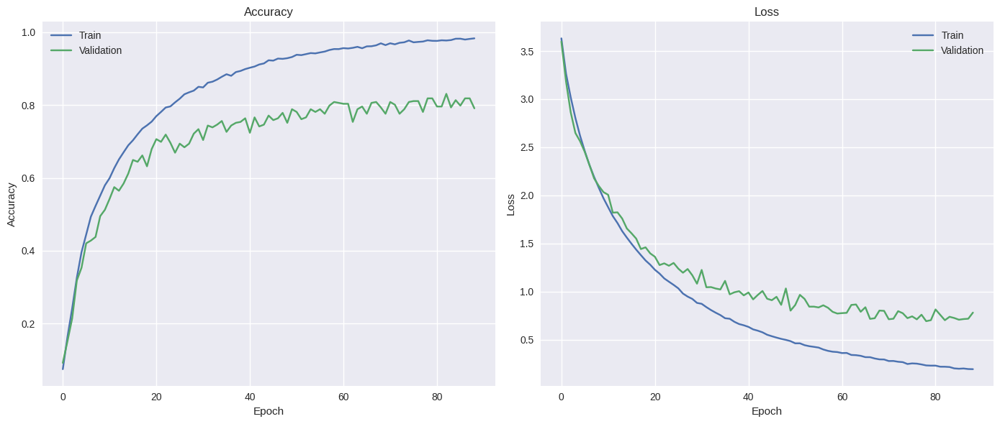

Best validation accuracy: 0.8308457732200623


In [41]:
log_df = pd.read_csv('model_stft.log')

plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(log_df['epoch'], log_df['accuracy'], label='Train')
plt.plot(log_df['epoch'], log_df['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(log_df['epoch'], log_df['loss'], label='Train')
plt.plot(log_df['epoch'], log_df['val_loss'], label='Validation')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

best_acc = log_df['val_accuracy'].max()
print('Best validation accuracy:', best_acc)

In [42]:
model.load_weights('model_stft.h5')
[loss_test, acc_test] = model.evaluate(X_test_exp, y_test, verbose=0)
print(f"Test loss: {loss_test}")
print(f"Test accuracy: {acc_test}")

Test loss: 0.7136913537979126
Test accuracy: 0.8282828330993652


13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 181ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step


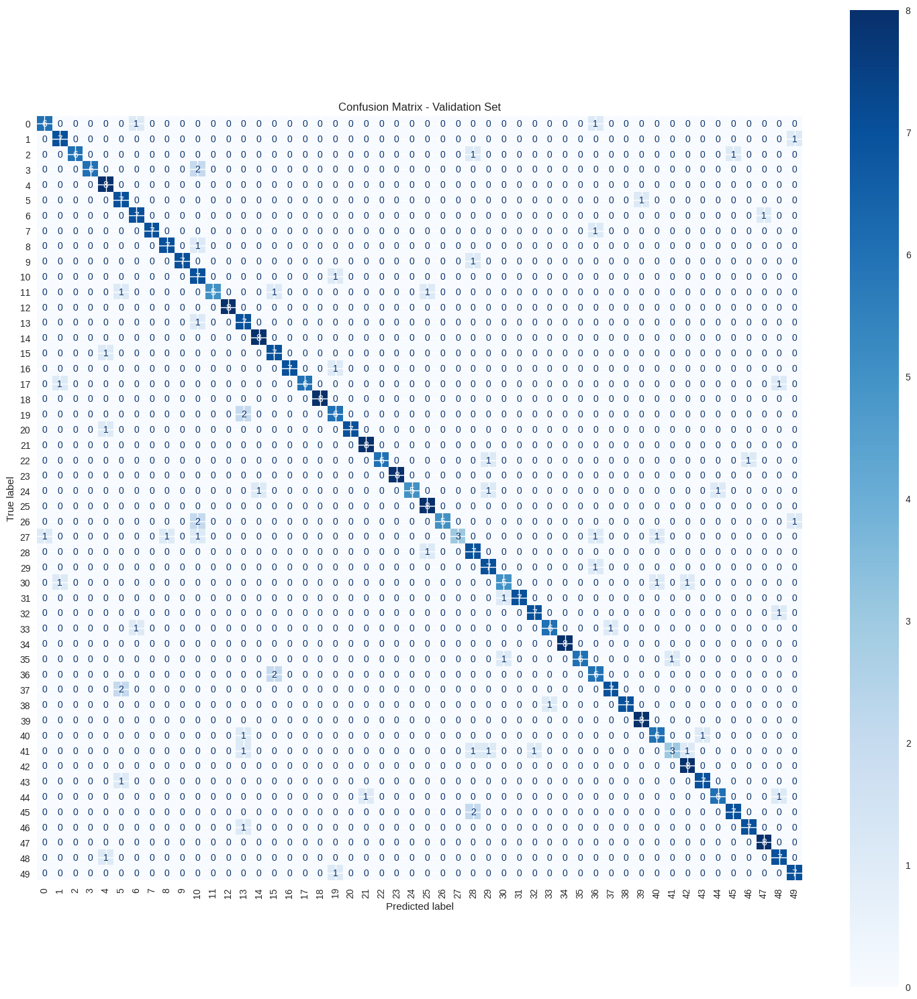

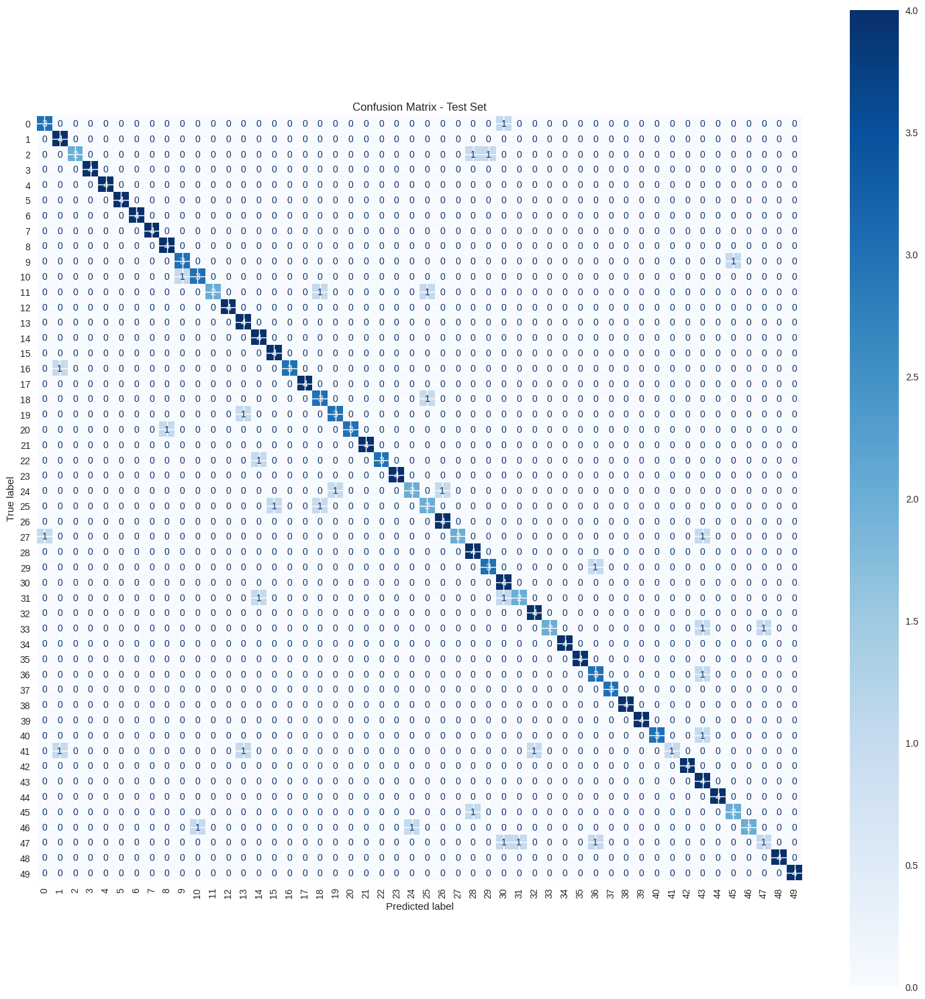

In [43]:
possible_classes = np.arange(0, 50)

pred_val = model.predict(X_val_exp)
pred_test = model.predict(X_test_exp)

pred_val_classes = np.argmax(pred_val, axis=1)
pred_test_classes = np.argmax(pred_test, axis=1)

# Confusion Matrix - Validation
cm_val = confusion_matrix(y_val, pred_val_classes)
fig_val, ax_val = plt.subplots(figsize=(15, 15))
disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val, display_labels=possible_classes)
disp_val.plot(cmap=plt.cm.Blues, ax=ax_val, xticks_rotation=90)
ax_val.set_title('Confusion Matrix - Validation Set')
plt.tight_layout()
plt.show()

# Confusion Matrix - Test
cm_test = confusion_matrix(y_test, pred_test_classes)
fig_test, ax_test = plt.subplots(figsize=(15, 15))
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=possible_classes)
disp_test.plot(cmap=plt.cm.Blues, ax=ax_test, xticks_rotation=90)
ax_test.set_title('Confusion Matrix - Test Set')
plt.tight_layout()
plt.show()

In [44]:
print(classification_report(y_val, pred_val_classes, zero_division=0))

              precision    recall  f1-score   support

           0       0.86      0.75      0.80         8
           1       0.78      0.88      0.82         8
           2       1.00      0.75      0.86         8
           3       1.00      0.75      0.86         8
           4       0.73      1.00      0.84         8
           5       0.64      0.88      0.74         8
           6       0.78      0.88      0.82         8
           7       1.00      0.88      0.93         8
           8       0.88      0.88      0.88         8
           9       1.00      0.88      0.93         8
          10       0.50      0.88      0.64         8
          11       1.00      0.62      0.77         8
          12       1.00      1.00      1.00         8
          13       0.58      0.88      0.70         8
          14       0.89      1.00      0.94         8
          15       0.70      0.88      0.78         8
          16       1.00      0.88      0.93         8
          17       1.00    

In [45]:
print(classification_report(y_test, pred_test_classes, zero_division=0))

              precision    recall  f1-score   support

           0       0.75      0.75      0.75         4
           1       0.67      1.00      0.80         4
           2       1.00      0.50      0.67         4
           3       1.00      1.00      1.00         4
           4       1.00      1.00      1.00         4
           5       1.00      1.00      1.00         4
           6       1.00      1.00      1.00         4
           7       1.00      1.00      1.00         4
           8       0.80      1.00      0.89         4
           9       0.75      0.75      0.75         4
          10       0.75      0.75      0.75         4
          11       1.00      0.50      0.67         4
          12       1.00      1.00      1.00         4
          13       0.67      1.00      0.80         4
          14       0.67      1.00      0.80         4
          15       0.80      1.00      0.89         4
          16       1.00      0.75      0.86         4
          17       1.00    